In [1]:
'''
This motebook is Prob3 in HW3 from ESE-6500 at UPenn
Special thanks to:
  Prof. Pratik Chaudhari
  @KailajeAnirudh (https://github.com/KailajeAnirudh/Machine-Perception-Projects)
  @Yvonne-OH (Zhanqian, student in ESE-6500)
  @JimMeizzz (Jim, student in ESE-6500)
  @BaoL067 (Binlong, student in ESE-6500)
'''


'\nThis motebook is Prob3 in HW3 from ESE-6500 at UPenn\nSpecial thanks to:\n  Prof. Pratik Chaudhari\n  @KailajeAnirudh (https://github.com/KailajeAnirudh/Machine-Perception-Projects)\n  @Yvonne-OH (Zhanqian, student in ESE-6500)\n  @JimMeizzz (Jim, student in ESE-6500)\n  @BaoL067 (Binlong, student in ESE-6500)\n'

In [2]:
from typing import Optional, Tuple
import torch
from torch import nn, Tensor
from torch.nn import functional as F
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
import json
import imageio
import cv2

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [3]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)


Sat Apr  6 00:09:58 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla V100-SXM2-16GB           Off | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0              24W / 300W |      0MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [4]:
root_path = '/content/drive/MyDrive/Colab Notebooks/'
for i,j,k in os.walk(root_path):
    print(i,j,k)


/content/drive/MyDrive/Colab Notebooks/ ['data', 'ESE650', 'model', 'oldlogs', 'logs'] ['Untitled', 'homework0.ipynb', 'Copy of homework1.ipynb', 'Copy of homework2.ipynb', 'Copy of homework3.ipynb', 'transforms_train.json', 'policy_iteration.ipynb', 'Untitled0.ipynb', 'ESE-6500 HW3-3 NeRF']
/content/drive/MyDrive/Colab Notebooks/data ['images'] []
/content/drive/MyDrive/Colab Notebooks/data/images [] ['r_57.png', 'r_94.png', 'r_43.png', 'r_80.png', 'r_97.png', 'r_85.png', 'r_25.png', 'r_56.png', 'r_30.png', 'r_52.png', 'r_35.png', 'r_21.png', 'r_34.png', 'r_19.png', 'r_51.png', 'r_84.png', 'r_8.png', 'r_9.png', 'r_44.png', 'r_20.png', 'r_26.png', 'r_42.png', 'r_81.png', 'r_55.png', 'r_95.png', 'r_91.png', 'r_93.png', 'r_69.png', 'r_53.png', 'r_37.png', 'r_23.png', 'r_27.png', 'r_96.png', 'r_33.png', 'r_86.png', 'r_78.png', 'r_22.png', 'r_32.png', 'r_87.png', 'r_46.png', 'r_68.png', 'r_83.png', 'r_36.png', 'r_31.png', 'r_45.png', 'r_54.png', 'r_40.png', 'r_50.png', 'r_47.png', 'r_92.pn

In [5]:
def load_colmap_data(root_path):
    """
    After using colmap2nerf.py to convert the colmap intrinsics and extrinsics,
    read in the transform_colmap.json file

    Expected Returns:
        An array of resized imgs, normalized to [0, 1]
        An array of poses, essentially the transform matrix
        Camera parameters: H, W, focal length

    NOTES:
        We recommend you resize the original images from 800x800 to lower resolution,
        i.e. 200x200, so it's easier for training. Change camera parameters accordingly
    """
    ## Implemented

    with open(os.path.join(root_path + 'transforms_train.json')) as file:
        json_data = json.load(file)

    # rescaling camera parameters
    original_h, original_w = 800, 800
    new_h, new_w = 200, 200

    camera_angle_x = json_data['camera_angle_x']
    focal_length = 0.5 * original_w / np.tan(0.5 * camera_angle_x)
    # focal_length = 0.5 * original_w * camera_angle_x / np.tan(0.5 * camera_angle_x)
    focal_resized = focal_length * (new_w / original_w)

    img_file_paths = []
    rotations = []
    poses = []
    imgs = []
    for frame in json_data['frames']:
        img_file_paths.append(frame['file_path'] + ".png")
        rotations.append(frame['rotation'])
        # poses.append(frame['transform_matrix'])
        poses.append(torch.tensor(frame['transform_matrix'], dtype=torch.float32))

        # See if frame['file_path'] + ".png" exists
        img_path = root_path + frame['file_path'] + ".png"
        if not os.path.exists(img_path):
            print(f"Image {frame['file_path'] + '.png'} not found")
            continue
        img = cv2.imread(img_path)
        # print(np.max(img))
        if img is None:
            print(f"Image {frame['file_path'] + '.png'} not found")
            continue

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # print(img.shape)
        # print(img.size)
        # print(img.dtype)
        # print(img)
        # plt.imshow(img)
        # plt.show()

        img = cv2.resize(img, (new_w, new_h))

        img = torch.tensor(img / 255.0, dtype=torch.float32)  # Convert to tensor
        imgs.append(img)

    # imgs = np.array(imgs)
    # poses = np.array(poses)
    imgs = torch.stack(imgs)
    poses = torch.stack(poses)

    H, W = new_h, new_w
    focal_length = focal_resized

    return imgs, poses, [H, W, focal_length]


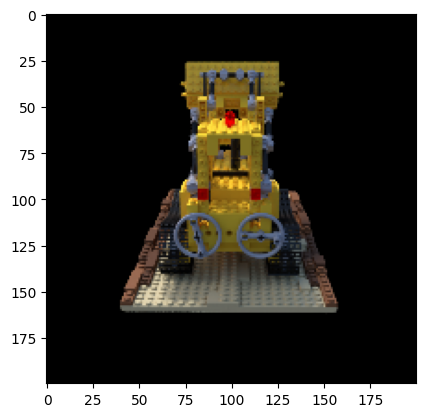

In [6]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

## Load provided data from ESE650

# Load data
imgs, poses, camera_hwf = load_colmap_data(root_path)

# Test if the images are loaded correctly
plt.imshow(imgs[0])
plt.show()

## Load data from UCSD

# import keras
# # Download the data if it does not already exist.
# url = (
#     "http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz"
# )
# data = keras.utils.get_file(origin=url)
# data = np.load(data)
# imgs = data["images"]
# poses = data["poses"]
# (num_images, H, W, _) = imgs.shape
# (poses, focal) = (data["poses"], data["focal"])
# camera_hwf = (H, W, focal)

# # Test if the images are loaded correctly
# plt.imshow(imgs[0])
# plt.show()


In [7]:
def get_rays(H, W, f, T_wc):
    """
    Compute rays passing through each pixel.

    Parameters:
        H: height of the image
        W: width of the image
        f: focal length of the camera
        T_wc: camera pose of 1 image, shape (4, 4)

    Expected Returns:
        ray_origins: A tensor of shape (H, W, 3) denoting the centers of each ray.
        ray_directions: A tensor of shape (H, W, 3) denoting the direction of each
            ray. ray_directions[i][j] denotes the direction (x, y, z) of the ray
            passing through the pixel at row index `i` and column index `j`.
    """
    ## Implemented

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Check the type of T_wc
    if isinstance(T_wc, np.ndarray):
        T_wc = torch.from_numpy(T_wc).to(device)
    elif isinstance(T_wc, torch.Tensor):
        T_wc = T_wc.to(device)
    else:
        print("T_wc type error")

    # print to check the data types of f, W, H
    # print('f is')
    # print(type(f))
    # print(type(W))
    # print(type(H))

    # Check the data type of f, make sure it's a number, if not then convert
    if not isinstance(f, (int, float)):
        f = f.item()
    if not isinstance(W, (int, float)):
        W = W.item()
    if not isinstance(H, (int, float)):
        H = H.item()

    # Compute the intrinsic matrix K
    # K = torch.tensor([[f, 0, W / 2],
    #           [0, f, H / 2],
    #           [0, 0, 1]],
    #           dtype=torch.float32,
    #           device=device)
    # K_inv = torch.inverse(K).to(device)
    K_inv = torch.tensor([[1/f, 0, -W/2/f],
              [0, 1/f, -H/2/f],
              [0, 0, 1]],
              dtype=torch.float32,
              device=device)

    # Create a meshgrid for pixel coordinates (i,j)
    # i, j = torch.meshgrid(torch.arange(W, dtype=torch.float32, device=device), torch.arange(H, dtype=torch.float32, device=device), indexing='xy')
    i, j = torch.meshgrid(torch.linspace(0, W-1, W, device=device), torch.linspace(0, H-1, H, device=device))
    # i = i.t().flatten()
    # j = j.t().flatten()
    # i = torch.linspace(0, W-1, W, device=device)
    # j = torch.linspace(0, H-1, H, device=device)

    # print("linspace:")
    # print(torch.linspace(0, W-1, W, device=device))
    # print("i.t():")
    # print(i.t())
    # print("i:")
    # print(i)

    ray_directions_camera = torch.stack([(i.t().flatten() - W * 0.5) / f, -(j.t().flatten() - H * 0.5) / f, -torch.ones_like(j.t().flatten(), device=device)], -1)
    ray_directions_world = torch.sum(ray_directions_camera[..., None, :] * T_wc[:3, :3], axis=-1)

    ray_origins = T_wc[:3, -1].expand(ray_directions_world.shape)

    # Write ray_directions using K matrix or its inverse
    # pixels tensor(40000,3)
    pixels = torch.stack([
        i.t().flatten(),
        j.t().flatten(),
        -torch.ones_like(i.t().flatten())], dim=-1)


    ray_directions = torch.sum(ray_directions_camera[..., None, :] * T_wc[:3, :3], axis=-1)

    # # Convert 2D pixel coordinates to 3D homogeneous pixel coordinates
    # pixel_coordinates = torch.stack([i, j, torch.ones_like(i)], dim=-1)

    # # Reshape pixel coordinates to tensor (H*W, 3)
    # pixel_coordinates = pixel_coordinates.view(-1, 3)

    # # Get camera coordinates
    # camera_coordinates = torch.mm(K_inv, pixel_coordinates.transpose(0, 1)).transpose(0, 1)

    # # Convert camera coordinates to homogeneous coordinates
    # camera_coordinates = torch.cat([camera_coordinates, torch.ones((H * W, 1), dtype=torch.float32, device=device)], dim=1)

    # # Get world coordinates
    # world_coordinates = (T_wc @ camera_coordinates.T).T
    # # world_coordinates = torch.mm(T_wc, camera_coordinates.transpose(0, 1)).transpose(0, 1)

    # # Calculate ray origins (camera position in the world frame)
    # ray_origins = T_wc[:3, -1].unsqueeze(0).expand(H * W, 3).reshape(H, W, 3)

    # # Calculate ray directions (world_coordinates - camera position) and normalize
    # ray_directions = world_coordinates[:, :3] - ray_origins.reshape(-1, 3)
    # ray_directions = ray_directions / torch.norm(ray_directions, dim=1, keepdim=True).expand_as(ray_directions)

    # Reshape rays to match the (H, W, 3) shape
    ray_directions = ray_directions_world.view(H, W, 3)
    ray_origins = ray_origins.view(H, W, 3)

    return ray_origins, ray_directions


In [8]:
def sample_points_from_rays(ray_origins, ray_directions, s_near, s_far, num_samples):
    """
    Compute a set of 3D points given the bundle of rays

    Parameters:
        ray_origins: A tensor of shape (H, W, 3) containing the origins of the rays.
        ray_directions: A tensor of shape (H, W, 3) containing the normalized direction of each ray.
        s_near: Scalar defining the near clipping threshold.
        s_far: Scalar defining the far clipping threshold.
        N_sample: Number of samples to take along each ray.

    Expected Returns:
        sampled_points: axis of the sampled points along each ray, shape (H, W, num_samples, 3)
        depth_values: sampled depth values along each ray, shape (H, W, num_samples)
    """
    ## Implemented

    device = ray_origins.device

    H, W, _ = ray_origins.shape

    # Create a linspace of depth values
    depths = torch.linspace(s_near, s_far, num_samples).to(device)

    # Expand and tile the depth values to match the shape of the ray origins
    depth_values = depths[None, None, :].expand(H, W, num_samples).clone()  # Clone after expand to ensure the tensor is contiguous

    # Adding randomness to the depth values, while keeping the first and the last depth value fixed
    # to ensure coverage from s_near to s_far.
    randomness_scale = 0.3
    if num_samples > 2:
        mid_depths = depth_values[:, :, 1:-1] + randomness_scale * torch.rand((H, W, num_samples-2)).to(device) * ((s_far - s_near) / (num_samples - 1))
        depth_values[:, :, 1:-1] = mid_depths

    # Calculate the 3D position of each sample point
    sampled_points = ray_origins[..., None, :] + ray_directions[..., None, :] * depth_values[..., :, None]

    return sampled_points, depth_values


In [9]:
def positional_encoding(x, max_freq_log2, include_input=True):
    """
    Apply positional encoding to the input. (Section 5.1 of original paper)
    We use positional encoding to map continuous input coordinates into a
    higher dimensional space to enable our MLP to more easily approximate a
    higher frequency function.

    Parameters:
        x: the input tensor to be positionally encoded.
        max_freq_log2: the log2 of the maximum frequency sinusoids (10 in the example).
        include_input: whether to include the input in the output.

    Expected Returns:
        pos_out: positional encoding of the input tensor.
                 (H*W*num_samples, (include_input + 2*freq) * 3)
    """
    ## Implemented

    # Prepare the frequency bands
    freq_bands = 2 ** torch.arange(max_freq_log2).to(x.device, dtype=x.dtype)

    # Initialize a list to hold our sinusoidal encodings
    sinusoidal_encodings = []

    # Calculate sine and cosine functions of the input tensor across different frequencies
    for freq in freq_bands:
        sinusoidal_encodings.append(torch.sin(x * freq))
        sinusoidal_encodings.append(torch.cos(x * freq))

    # Concatenate all the sine and cosine encodings to get the positional encodings
    pos_out = torch.cat(sinusoidal_encodings, dim=-1)

    # Include the original input tensor if specified
    if include_input:
        pos_out = torch.cat([x, pos_out], dim=-1)

    return pos_out


In [10]:
def volume_rendering(
    radiance_field: torch.Tensor,
    ray_origins: torch.Tensor,
    depth_values: torch.Tensor
) -> torch.Tensor:
    """
    Differentiably renders a radiance field, given the origin of each ray in the
    bundle, and the sampled depth values along them.

    Args:
        radiance_field: at each query location (X, Y, Z), our model predict
                        RGB color and a volume density (sigma), shape (H, W, num_samples, 4)
        ray_origins: origin of each ray, shape (H, W, 3)
        depth_values: sampled depth values along each ray, shape (H, W, num_samples)

    Expected Returns:
        rgb_map: rendered RGB image, shape (H, W, 3)
    """
    # TODO: volume_rendering

    device = radiance_field.device

    H, W, num_samples, _ = radiance_field.shape

    # Extract RGB and sigma from radiance field
    rgb = torch.sigmoid(radiance_field[..., :3])  # (H, W, num_samples, 3)
    sigma = torch.relu(radiance_field[..., 3])   # (H, W, num_samples)

    # Calculate the length of each ray segment (s_jp1 - s_j)
    # delta = depth_values[..., 1:] - depth_values[..., :-1]  # (H, W, num_samples-1)
    # # delta = torch.cat([delta, torch.ones((H, W, 1)).to(device)], dim=-1)
    # delta = torch.cat([delta, torch.Tensor([1e10]).expand(delta[..., :1].shape).to(device)], dim=-1)  # add a very large value to the end
    delta_i = 1e10 * torch.ones_like(depth_values).to(device)
    delta_i[..., :-1] = torch.diff(depth_values, dim=-1)

    # Calculate opacities (alpha values)
    alpha = 1.0 - torch.exp(-sigma * delta_i)  # (H, W, num_samples)

    # Calculate transmittance (p(s_i), product of 1 - alpha values)
    # We use a cumulative product, so we need to use cumprod() on (1 - alpha)
    cum_prod = torch.cumprod(1.0 - alpha, dim=-1)  # (H, W, num_samples)
    cum_prod = torch.roll(cum_prod, 1, dims=-1)

    # Calculate weights
    weights = alpha * cum_prod  # (H, W, num_samples)

    # Render the RGB image by weighted sum of RGB colors along the rays
    rgb_map = torch.sum(weights[..., None] * rgb, dim=-2)  # (H, W, 3)

    return rgb_map


In [11]:
class TinyNeRF(torch.nn.Module):
    def __init__(self, pos_dim, fc_dim=128):
        """
        Initialize a tiny nerf network, which composed of linear layers and
        ReLU activation. More specifically: linear - relu - linear - relu - linear
        - relu -linear. The module is intentionally made small so that we could
        achieve reasonable training time

        Args:
            pos_dim: dimension of the positional encoding output
            fc_dim: dimension of the fully connected layer
        """
        super().__init__()

        self.nerf = nn.Sequential(
            nn.Linear(pos_dim, fc_dim),
            nn.ReLU(),
            nn.Linear(fc_dim, fc_dim),
            nn.ReLU(),
            nn.Linear(fc_dim, fc_dim),
            nn.ReLU(),
            nn.Linear(fc_dim, 4)
        )

    def forward(self, x):
        """
        Output volume density and RGB color (4 dimensions), given a set of
        positional encoded points sampled from the rays
        """
        x = self.nerf(x)
        return x


In [12]:
def get_minibatches(inputs: torch.Tensor, chunksize: Optional[int] = 1024 * 8):
    """
    Takes a huge tensor (ray "bundle") and splits it into a list of minibatches.
    Each element of the list (except possibly the last) has dimension `0` of length `chunksize`.
    """
    return [inputs[i:i + chunksize] for i in range(0, inputs.shape[0], chunksize)]


In [13]:
def nerf_step_forward(height, width, focal_length, trans_matrix,
                      near_point, far_point, num_depth_samples_per_ray,
                      chunksize, model):
    """
    Perform one iteration of training, which take information of one of the
    training images, and try to predict its rgb values

    Args:
        height: height of the image
        width: width of the image
        focal_length: focal length of the camera
        trans_matrix: transformation matrix, which is also the camera pose
        near_point: threshhold of nearest point
        far_point: threshold of farthest point
        num_depth_samples_per_ray: number of sampled depth from each rays in the ray bundle
        get_minibatches_function: function to cut the ray bundles into several chunks
                                  to avoid out-of-memory issue

    Expected Returns:
        rgb_predicted: predicted rgb values of the training image
    """
    ################### YOUR CODE START ###################

    # Get the "bundle" of rays through all image pixels
    ray_origins, ray_directions = get_rays(height, width, focal_length, trans_matrix)

    # Sample points along each ray
    sampled_points, depth_values = sample_points_from_rays(ray_origins, ray_directions, near_point, far_point, num_depth_samples_per_ray)

    # Get batches
    H, W, num_points, _ = sampled_points.shape

    # Flattening ray points from (H, W, num_points, 3) to (H*W, num_points, 3)
    ray_points_flattened = sampled_points.reshape(-1, num_points, 3)

    # Applying positional encoding to ray points and directions
    num_x_freqs = 10  # 2^1 to 2^10
    include_input = True  # Include 2^0
    pos = positional_encoding(ray_points_flattened, num_x_freqs, include_input)
    ray_point_batches = get_minibatches(pos, chunksize)

    ################### YOUR CODE END ###################

    # # Split the encoded points into "chunks", run the model on all chunks, and
    # # concatenate the results (to avoid out-of-memory issues).
    # batches = get_minibatches(pos_enc_points, chunksize)

    radiance_field = []
    for ray_point_batch in ray_point_batches:
        radiance_field.append(model(ray_point_batch))
    # flatten radiance field
    radiance_field = torch.cat(radiance_field, dim=0)  # (H*W*num_samples, 4)

    # "Unflatten" the radiance field.
    unflattened_shape = [height, width, num_depth_samples_per_ray, 4]  # (H, W, num_samples, 4)
    radiance_field = torch.reshape(radiance_field, unflattened_shape)  # (H, W, num_samples, 4)

    ################### YOUR CODE START ###################

    # Perform differentiable volume rendering to re-synthesize the RGB image. # (H, W, 3)
    rgb_predicted = volume_rendering(radiance_field, ray_origins, depth_values)

    ################### YOUR CODE END ###################

    return rgb_predicted


In [14]:
def train(images, poses, hwf, near_point,
          far_point, num_depth_samples_per_ray,
          num_iters, model, chunksize, DEVICE="cuda"):
    """
    Training a tiny nerf model

    Args:
        images: all the images extracted from dataset (including train, val, test)
        poses: poses of the camera, which are used as transformation matrix
        hwf: [height, width, focal_length]
        near_point: threshhold of nearest point
        far_point: threshold of farthest point
        num_depth_samples_per_ray: number of sampled depth from each rays in the ray bundle
        num_iters: number of training iterations
        model: predefined tiny NeRF model
    """
    H, W, focal_length = hwf
    H = int(H)
    W = int(W)
    n_train = images.shape[0]

    # Optimizer parameters
    lr = 5e-3  # 5e-3
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    # Seed RNG, for repeatability
    seed = 9458
    torch.manual_seed(seed)
    np.random.seed(seed)

    # Display parameters
    disp_freq = 50
    psnrs = []
    losses = []
    iters = []
    directory_path = 'logs'

    for _ in tqdm(range(num_iters + 1)):
        # Randomly pick a training image as the target, get rgb value and camera pose
        train_idx = np.random.randint(n_train)
        train_img_rgb = images[train_idx, ..., :3]
        train_pose = poses[train_idx]

        # Run one iteration of TinyNeRF and get the rendered RGB image.
        rgb_predicted = nerf_step_forward(H, W, focal_length,
                          train_pose, near_point,
                          far_point, num_depth_samples_per_ray,
                          chunksize, model)
        # rgb_predicted = one_forward_pass(H, W, focal_length, train_pose, near_point, far_point, num_depth_samples_per_ray, model, 10, 4)

        # Compute mean-squared error between the predicted and target images
        loss = torch.nn.functional.mse_loss(rgb_predicted, train_img_rgb)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        # Print the loss at every step
        # print(f"Iter: {_}, Loss: {loss.item()}")

        # Display training progress
        if _ % disp_freq == 0:

            iters.append(_)

            # Compute PSNR
            # psnr = 10 * torch.log10(1 / loss)  # Compute PSNR, convert to scalar
            # psnrs.append(psnr.cpu().detach().numpy())  # Move to cpu and convert to numpy

            # Output loss
            print(f"Iter: {_}, Loss: {loss.item()}")
            losses.append(loss.item())

            plt.figure(figsize=(15, 5))

            # # Display the PSNR curve
            # plt.subplot(1, 3, 1)
            # plt.plot(iters, psnrs)

            # Display the loss curve
            plt.subplot(1, 3, 1)
            plt.plot(iters, losses)
            plt.xlabel('Iterations')
            plt.ylabel('Loss')
            plt.title('Loss at Iter ' + str(_))

            # Display the predicted image
            plt.subplot(1, 3, 2)
            predicted_img = rgb_predicted.cpu().detach().numpy()
            predicted_img = np.clip(predicted_img, 0, 1)
            plt.imshow(predicted_img)
            plt.title('Predicted at Iter ' + str(_))

            #  Display the ground truth image
            plt.subplot(1, 3, 3)
            ground_truth_img = train_img_rgb.cpu().detach().numpy()
            ground_truth_img = np.clip(ground_truth_img, 0, 1)
            plt.imshow(ground_truth_img)
            plt.title('Ground Truth Image')

            plt.savefig(root_path + directory_path + '/training_progress_2_' + str(_) + '.png')
            plt.show()

    print('Finish training')


  0%|          | 0/2001 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Iter: 0, Loss: 0.16379983723163605


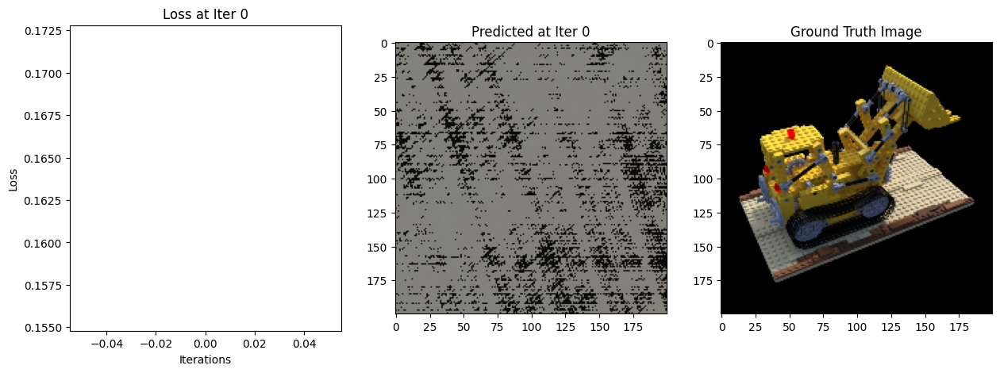

  2%|▏         | 50/2001 [00:19<10:03,  3.23it/s]

Iter: 50, Loss: 0.049400441348552704


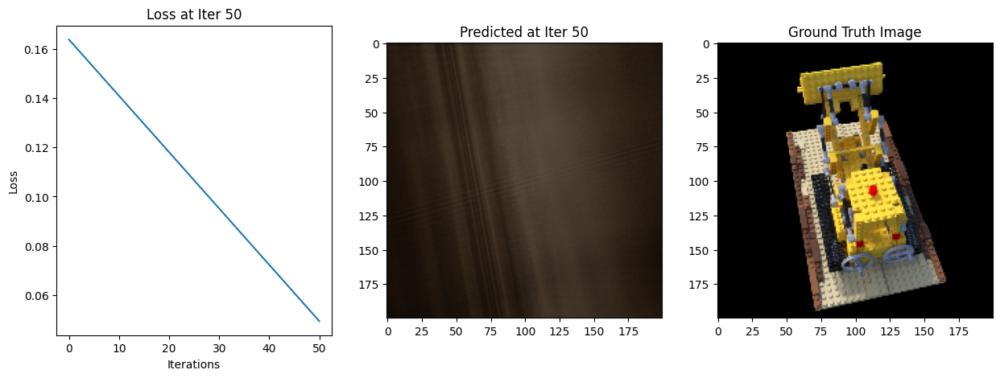

  5%|▍         | 100/2001 [00:36<09:45,  3.24it/s]

Iter: 100, Loss: 0.04041566699743271


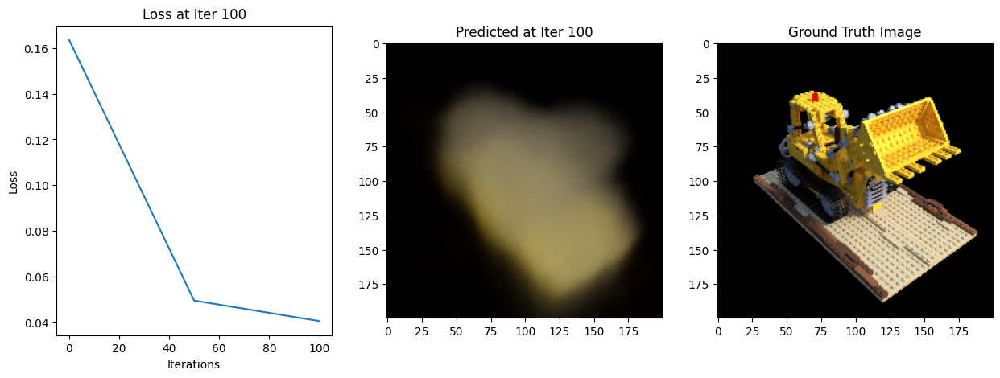

  7%|▋         | 150/2001 [00:53<09:30,  3.24it/s]

Iter: 150, Loss: 0.017164509743452072


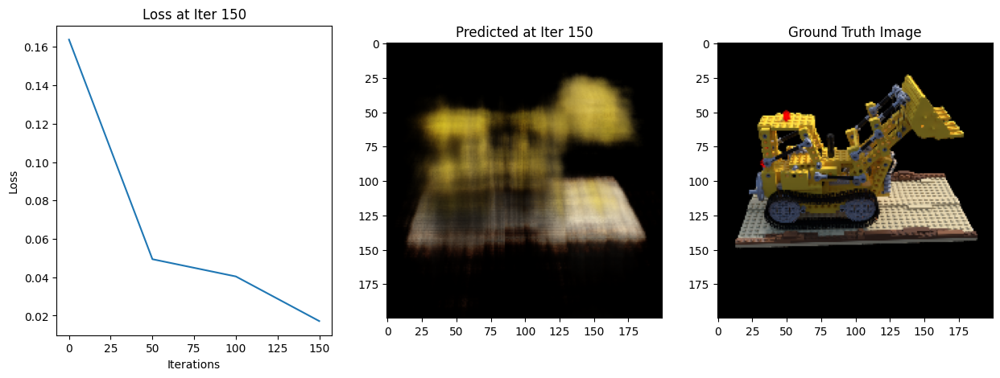

 10%|▉         | 200/2001 [01:10<09:15,  3.24it/s]

Iter: 200, Loss: 0.01696890965104103


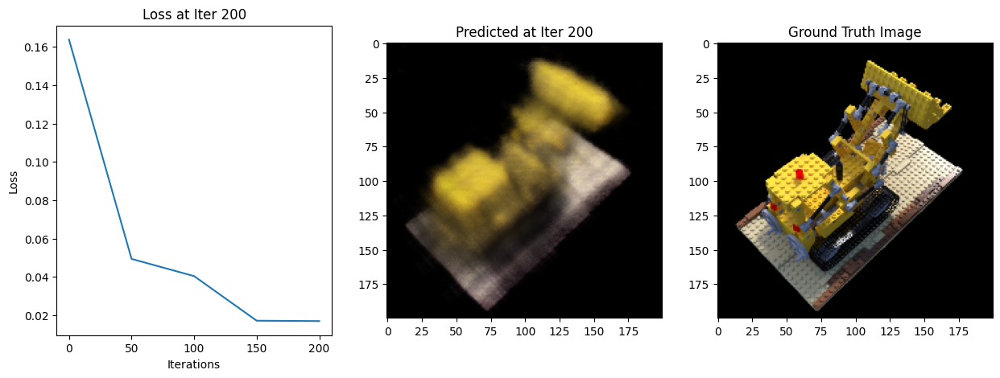

 12%|█▏        | 250/2001 [01:27<09:00,  3.24it/s]

Iter: 250, Loss: 0.006797876209020615


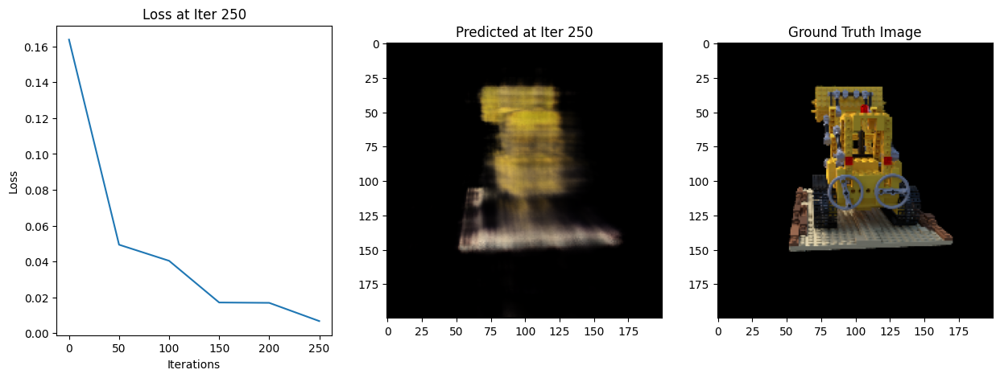

 15%|█▍        | 300/2001 [01:44<08:43,  3.25it/s]

Iter: 300, Loss: 0.011074024252593517


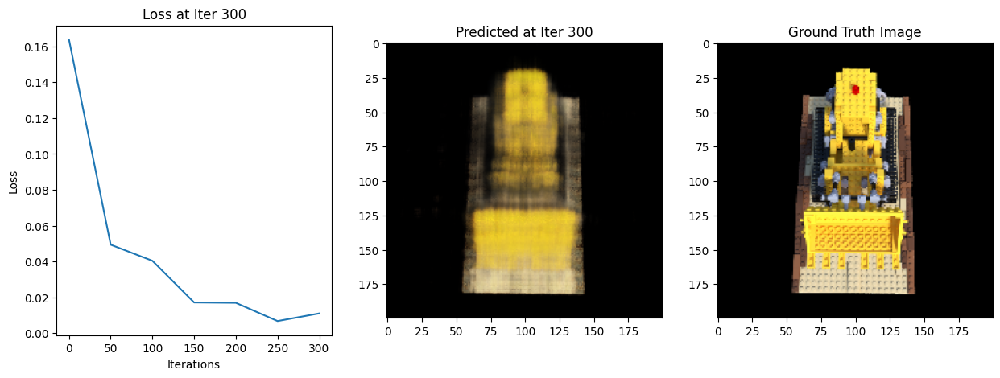

 17%|█▋        | 350/2001 [02:01<08:28,  3.25it/s]

Iter: 350, Loss: 0.0077605112455785275


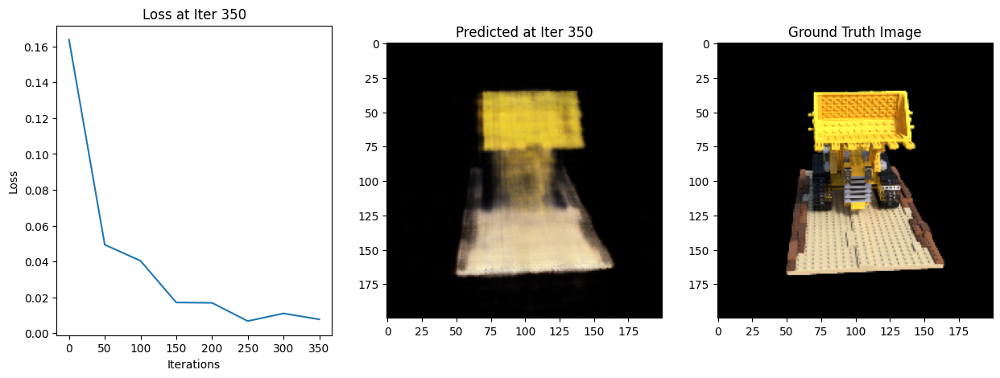

 20%|█▉        | 400/2001 [02:18<08:12,  3.25it/s]

Iter: 400, Loss: 0.007206947077065706


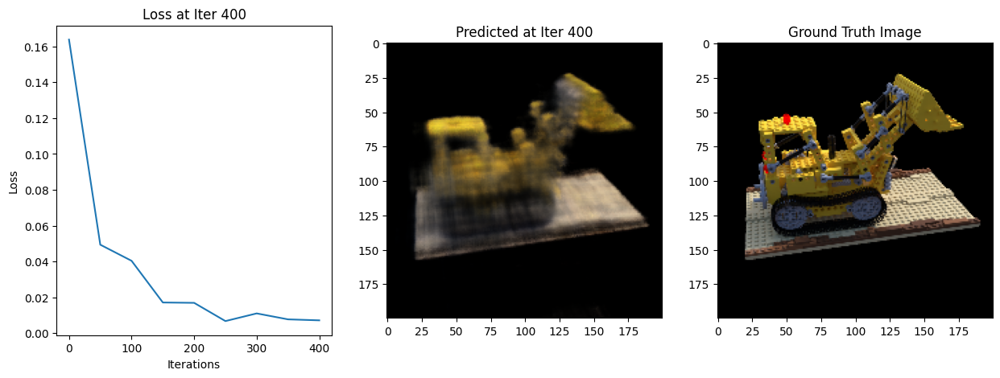

 22%|██▏       | 450/2001 [02:35<07:57,  3.25it/s]

Iter: 450, Loss: 0.013206333853304386


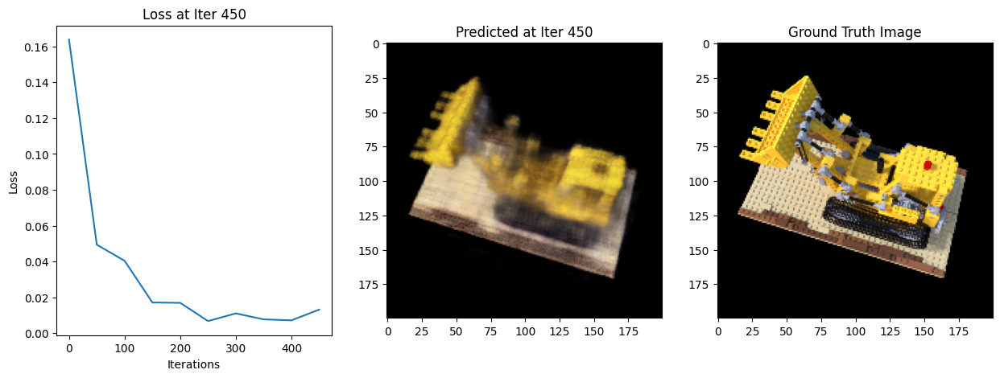

 25%|██▍       | 500/2001 [02:52<07:40,  3.26it/s]

Iter: 500, Loss: 0.009302089922130108


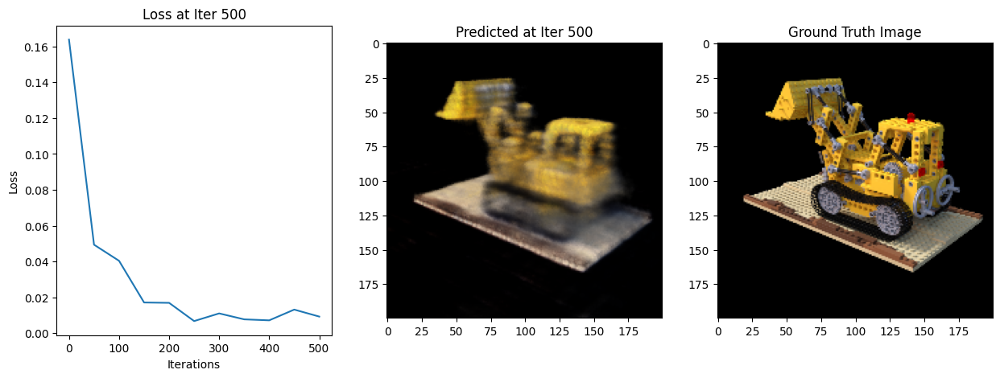

 27%|██▋       | 550/2001 [03:09<07:24,  3.26it/s]

Iter: 550, Loss: 0.008942128159105778


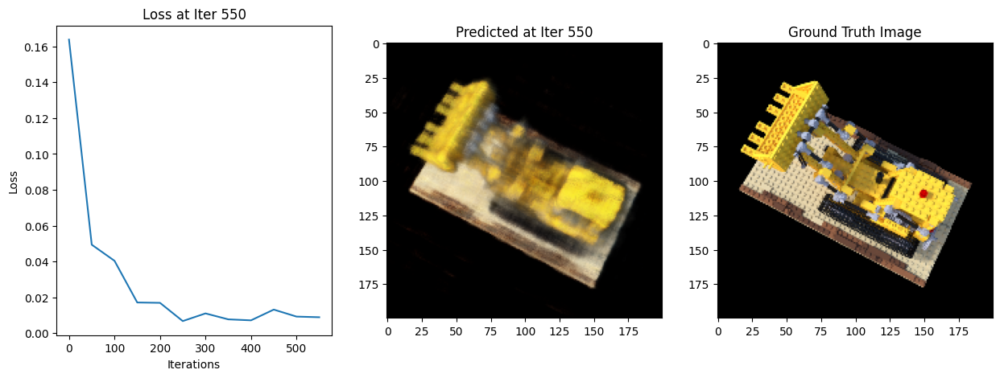

 30%|██▉       | 600/2001 [03:26<07:09,  3.26it/s]

Iter: 600, Loss: 0.006274547427892685


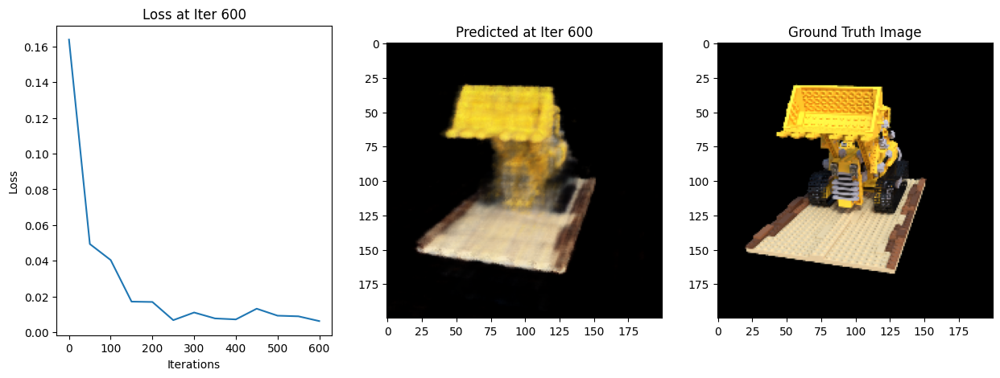

 32%|███▏      | 650/2001 [03:43<06:54,  3.26it/s]

Iter: 650, Loss: 0.007413048762828112


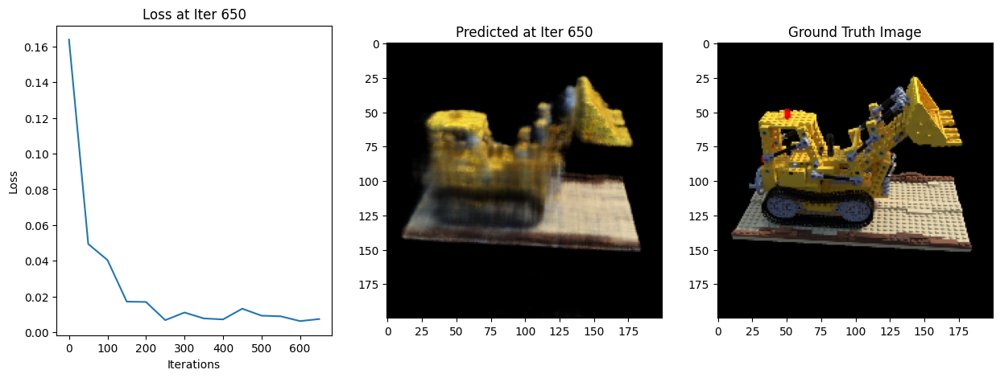

 35%|███▍      | 700/2001 [04:00<06:40,  3.25it/s]

Iter: 700, Loss: 0.008933053351938725


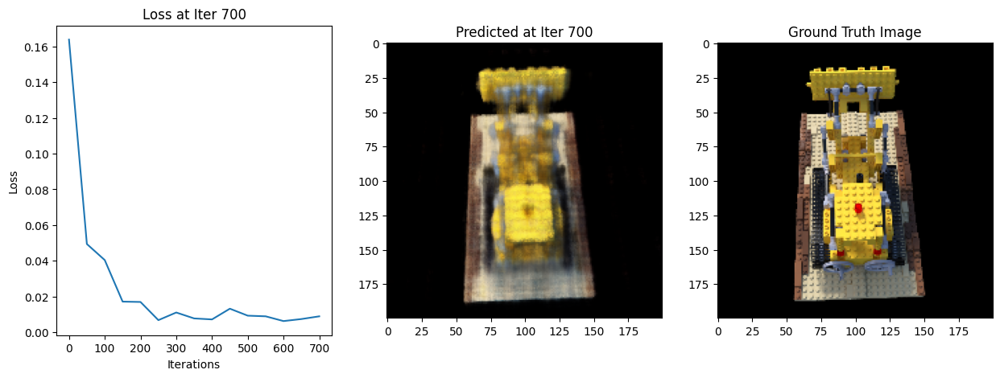

 37%|███▋      | 750/2001 [04:17<06:23,  3.26it/s]

Iter: 750, Loss: 0.009277860634028912


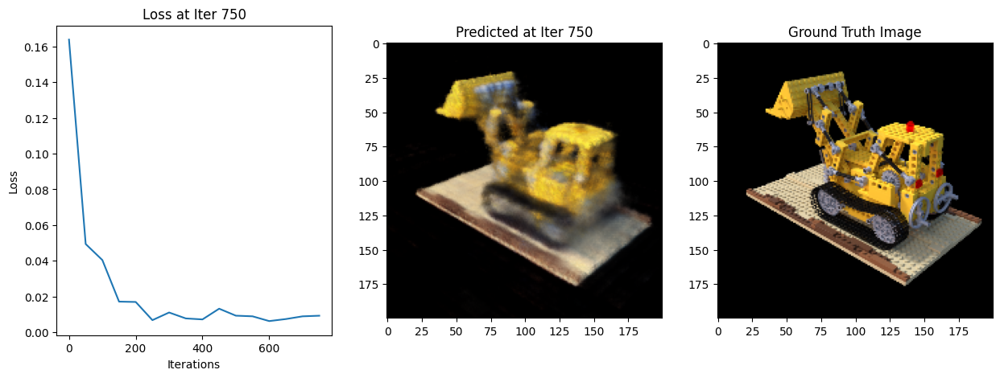

 40%|███▉      | 800/2001 [04:34<06:08,  3.26it/s]

Iter: 800, Loss: 0.009313446469604969


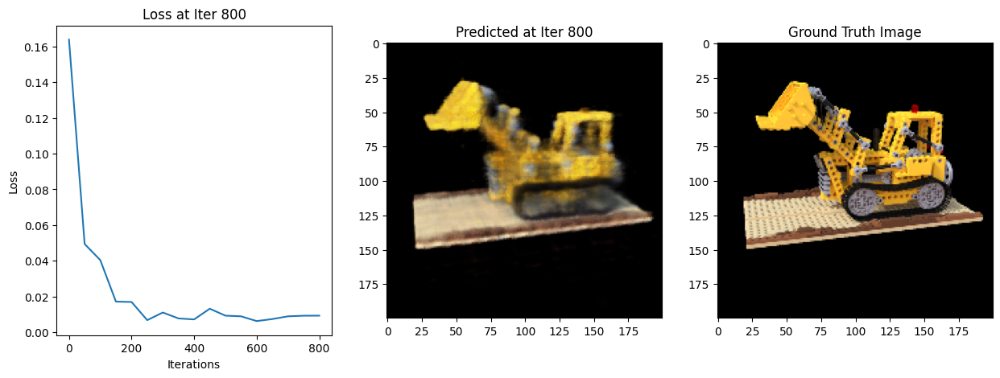

 42%|████▏     | 850/2001 [04:51<05:55,  3.24it/s]

Iter: 850, Loss: 0.007414928637444973


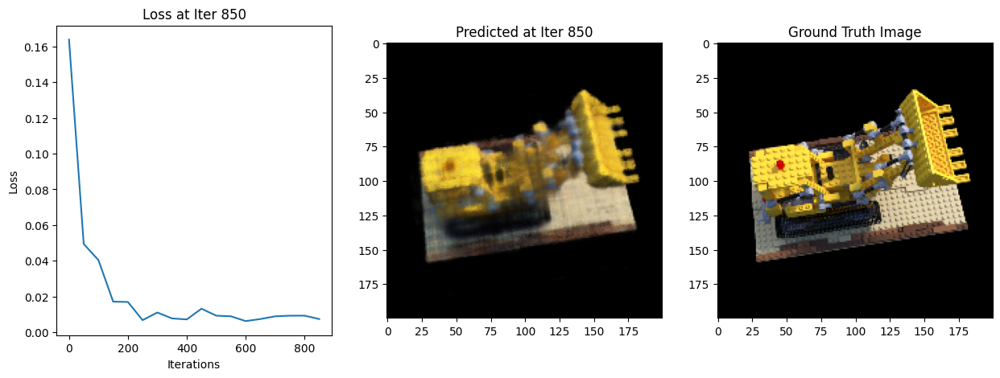

 45%|████▍     | 900/2001 [05:08<05:39,  3.24it/s]

Iter: 900, Loss: 0.009741518646478653


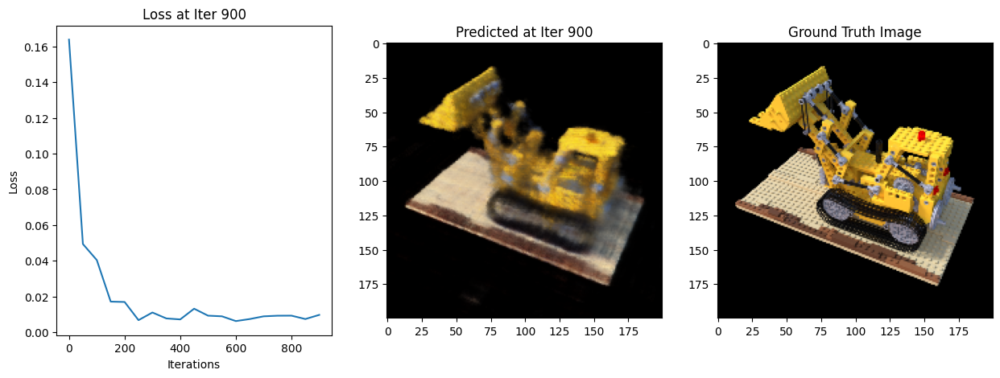

 47%|████▋     | 950/2001 [05:26<05:24,  3.24it/s]

Iter: 950, Loss: 0.005636993329972029


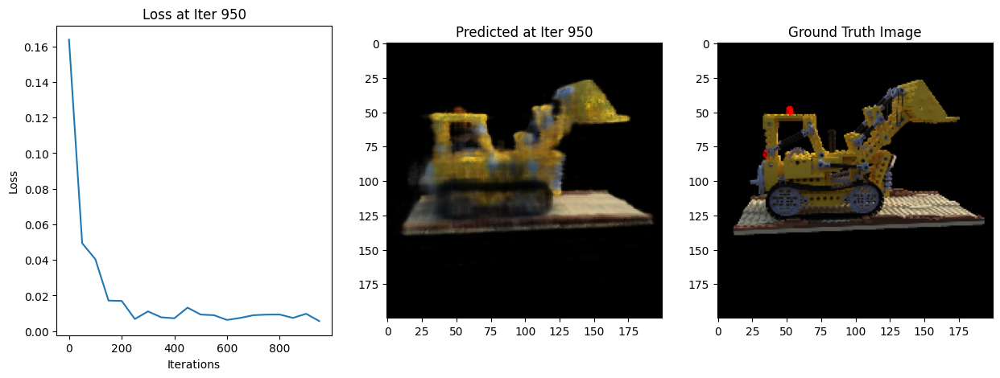

 50%|████▉     | 1000/2001 [05:43<05:08,  3.25it/s]

Iter: 1000, Loss: 0.007284339051693678


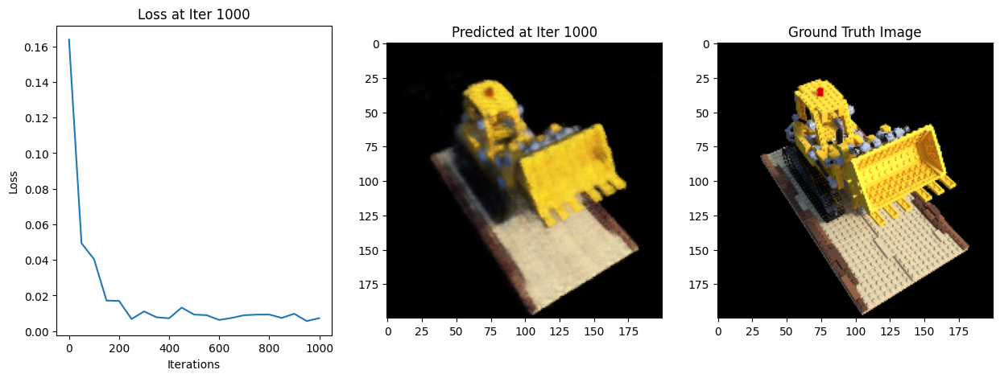

 52%|█████▏    | 1050/2001 [06:00<04:54,  3.23it/s]

Iter: 1050, Loss: 0.008616368286311626


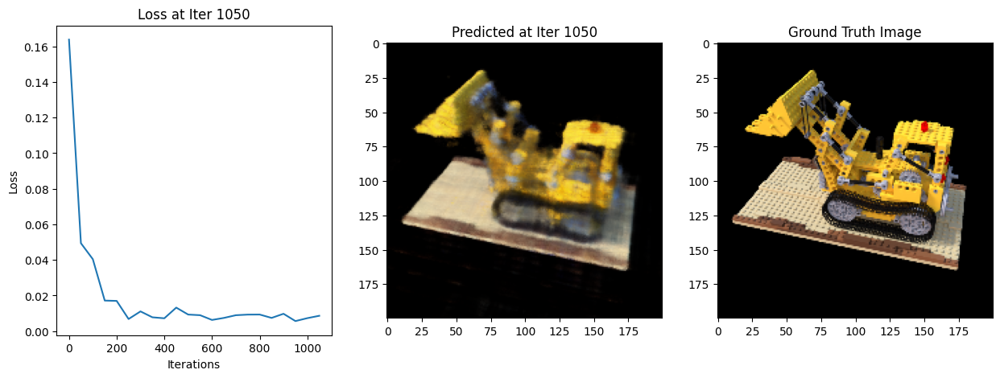

 55%|█████▍    | 1100/2001 [06:17<04:37,  3.24it/s]

Iter: 1100, Loss: 0.006358126178383827


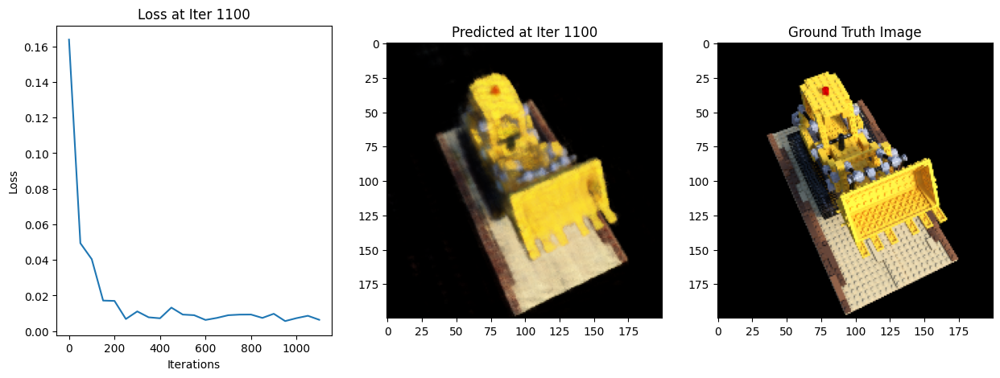

 57%|█████▋    | 1150/2001 [06:34<04:21,  3.25it/s]

Iter: 1150, Loss: 0.007153692655265331


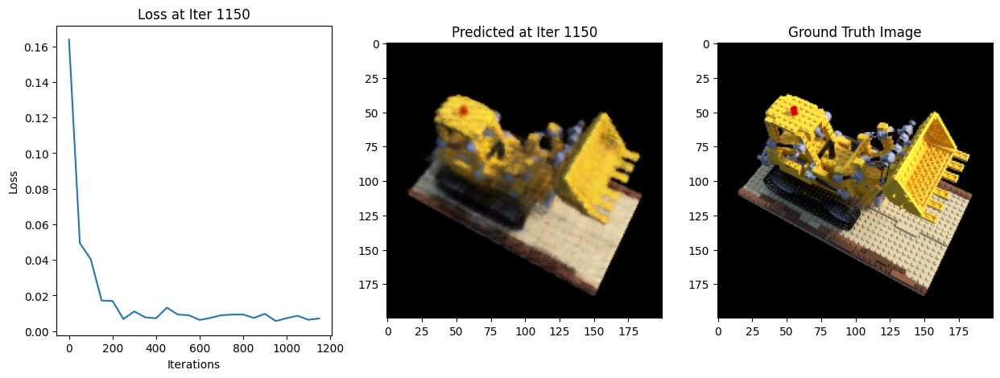

 60%|█████▉    | 1200/2001 [06:51<04:05,  3.26it/s]

Iter: 1200, Loss: 0.006081755738705397


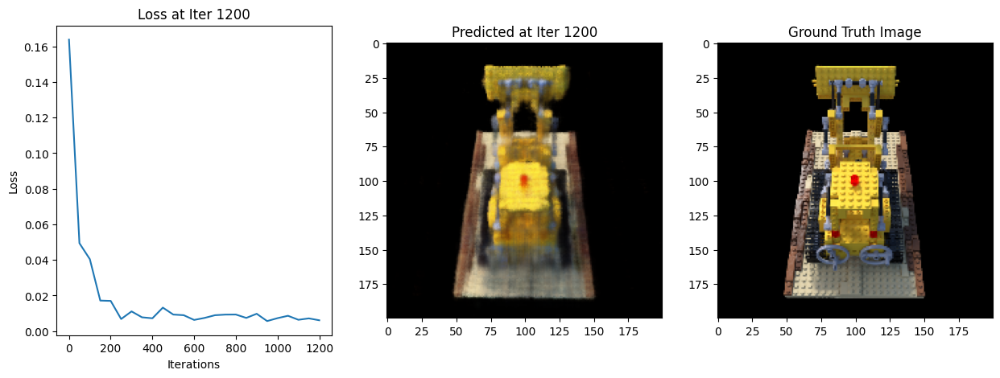

 62%|██████▏   | 1250/2001 [07:08<03:51,  3.24it/s]

Iter: 1250, Loss: 0.009185868315398693


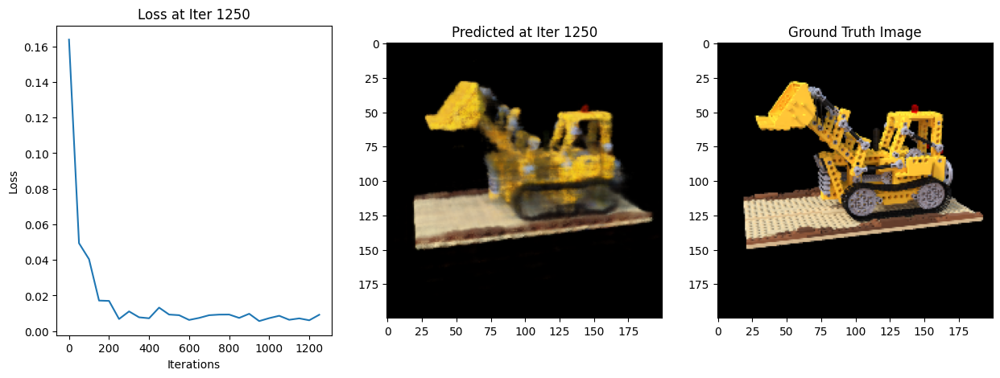

 65%|██████▍   | 1300/2001 [07:25<03:35,  3.26it/s]

Iter: 1300, Loss: 0.00551640335470438


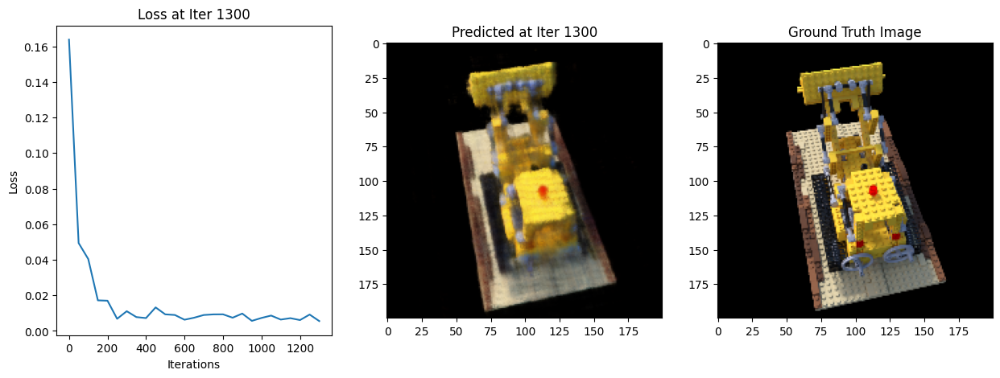

 67%|██████▋   | 1350/2001 [07:42<03:19,  3.26it/s]

Iter: 1350, Loss: 0.0038194702938199043


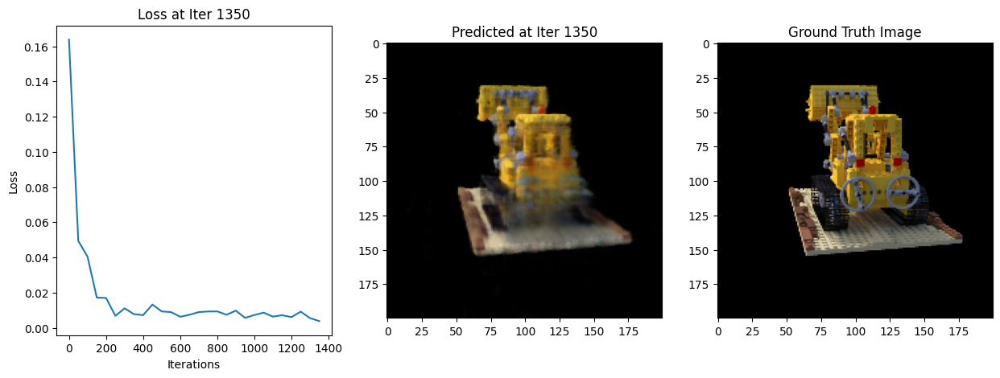

 70%|██████▉   | 1400/2001 [07:59<03:04,  3.26it/s]

Iter: 1400, Loss: 0.004488094709813595


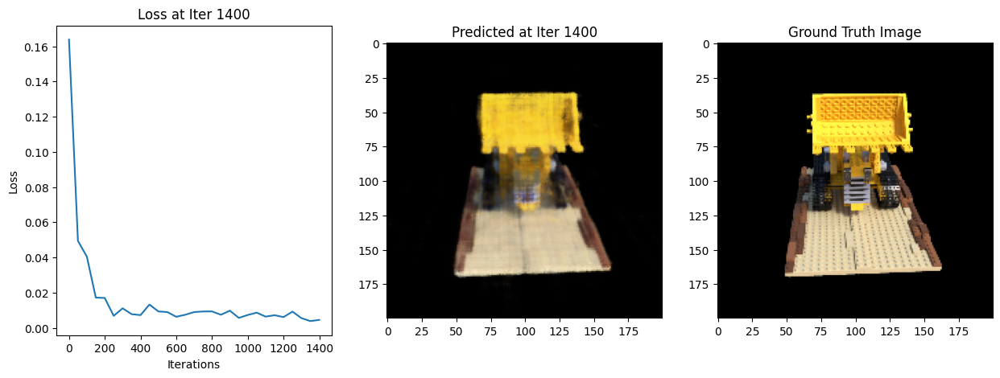

 72%|███████▏  | 1450/2001 [08:16<02:48,  3.26it/s]

Iter: 1450, Loss: 0.004703924525529146


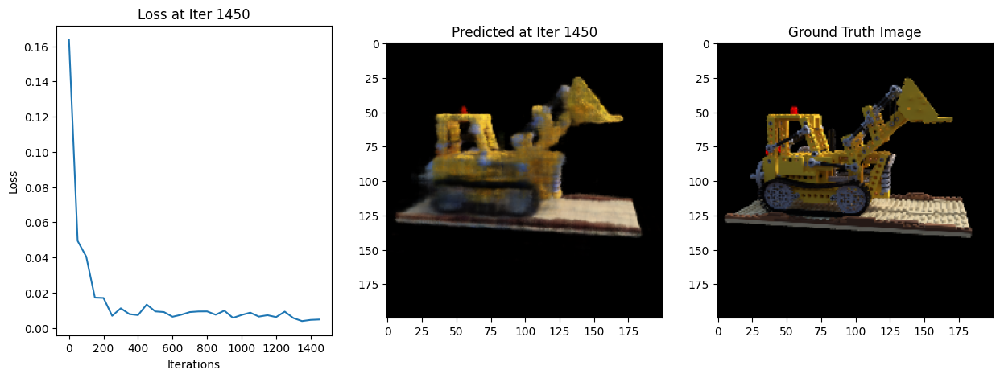

 75%|███████▍  | 1500/2001 [08:33<02:33,  3.26it/s]

Iter: 1500, Loss: 0.007598678581416607


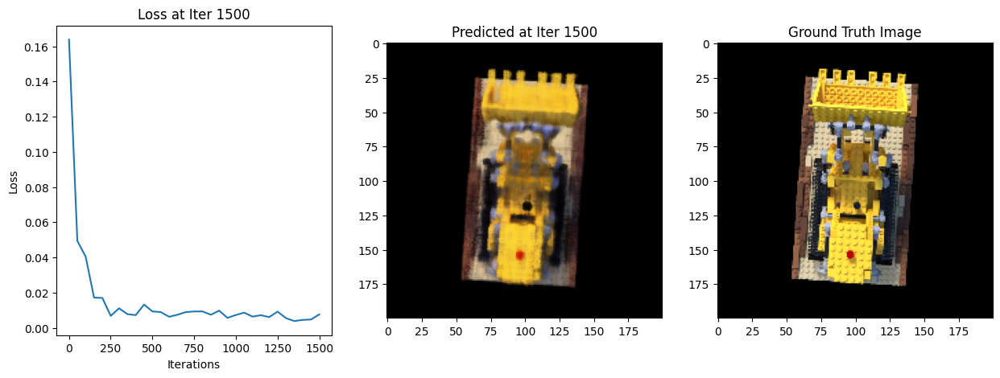

 77%|███████▋  | 1550/2001 [08:51<02:19,  3.24it/s]

Iter: 1550, Loss: 0.006155713461339474


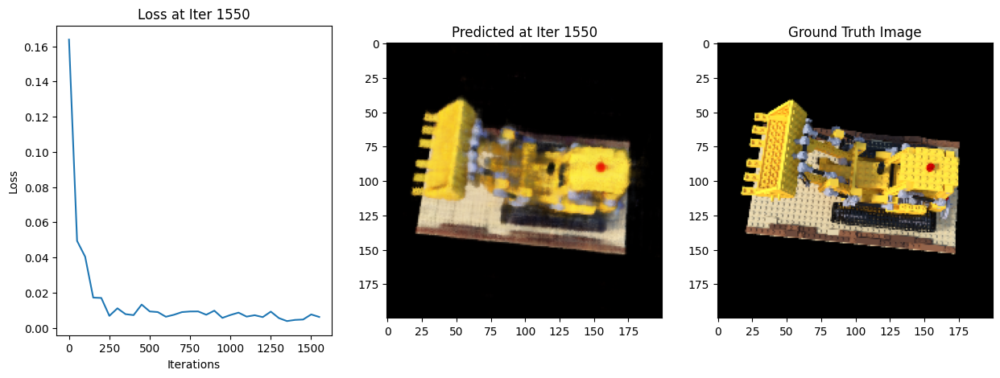

 80%|███████▉  | 1600/2001 [09:08<02:04,  3.23it/s]

Iter: 1600, Loss: 0.0029593072831630707


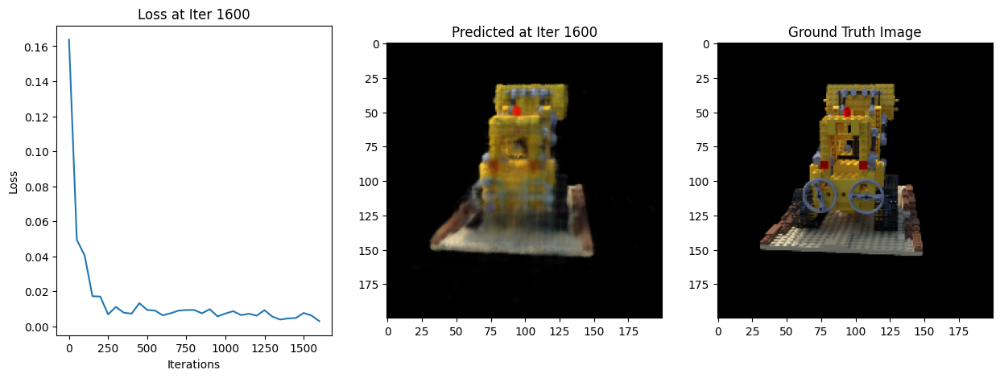

 82%|████████▏ | 1650/2001 [09:25<01:48,  3.25it/s]

Iter: 1650, Loss: 0.005573463160544634


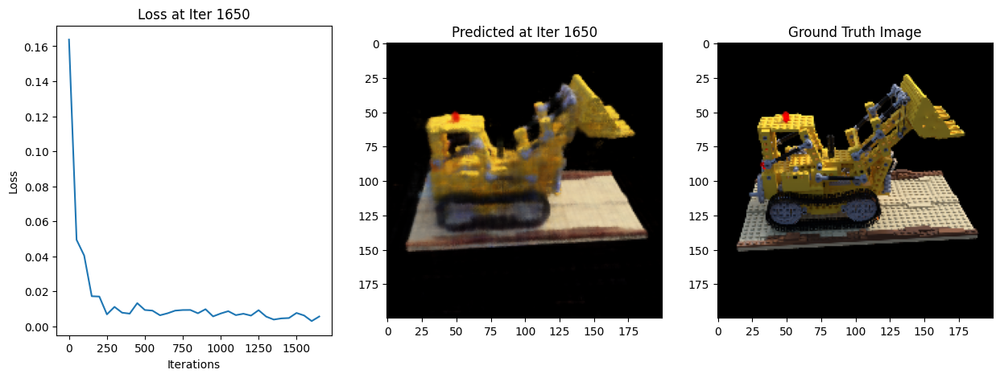

 85%|████████▍ | 1700/2001 [09:42<01:32,  3.24it/s]

Iter: 1700, Loss: 0.007775678765028715


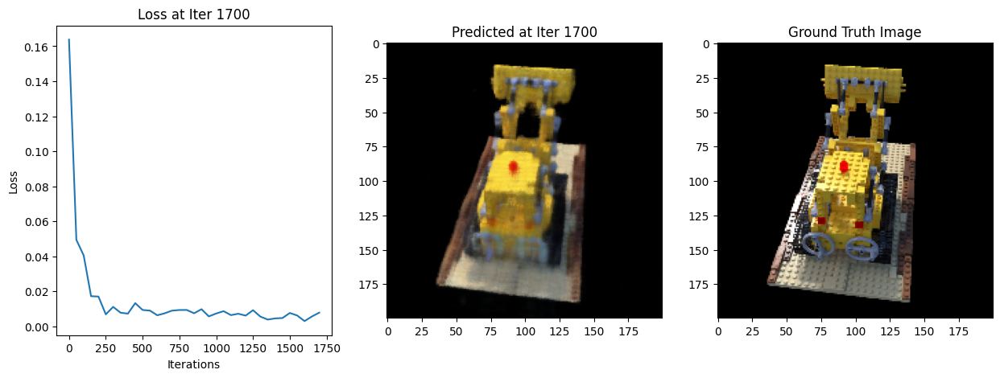

 87%|████████▋ | 1750/2001 [09:59<01:17,  3.25it/s]

Iter: 1750, Loss: 0.006242278032004833


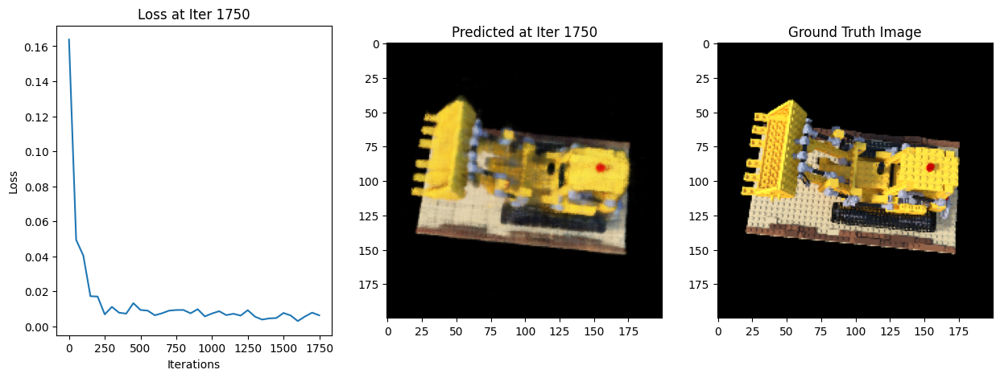

 90%|████████▉ | 1800/2001 [10:16<01:01,  3.25it/s]

Iter: 1800, Loss: 0.006468779407441616


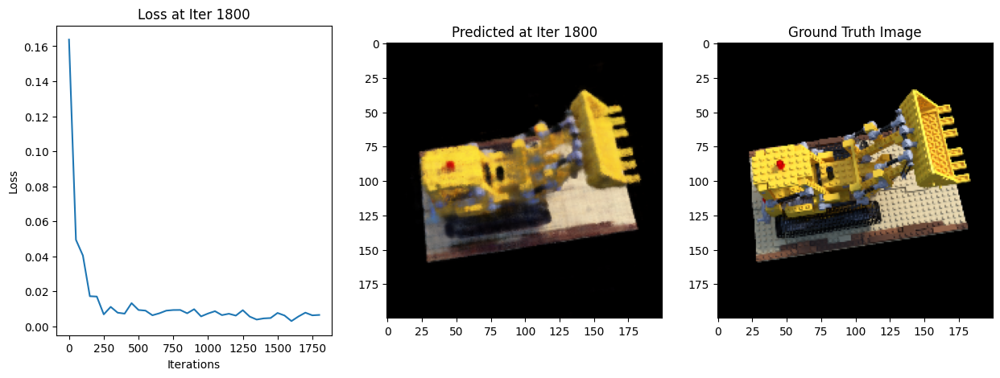

 92%|█████████▏| 1850/2001 [10:33<00:46,  3.26it/s]

Iter: 1850, Loss: 0.006744167301803827


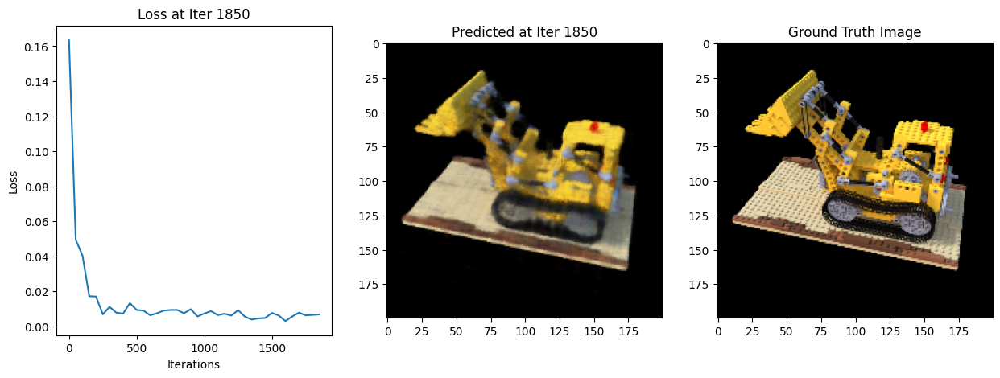

 95%|█████████▍| 1900/2001 [10:50<00:30,  3.26it/s]

Iter: 1900, Loss: 0.006125968415290117


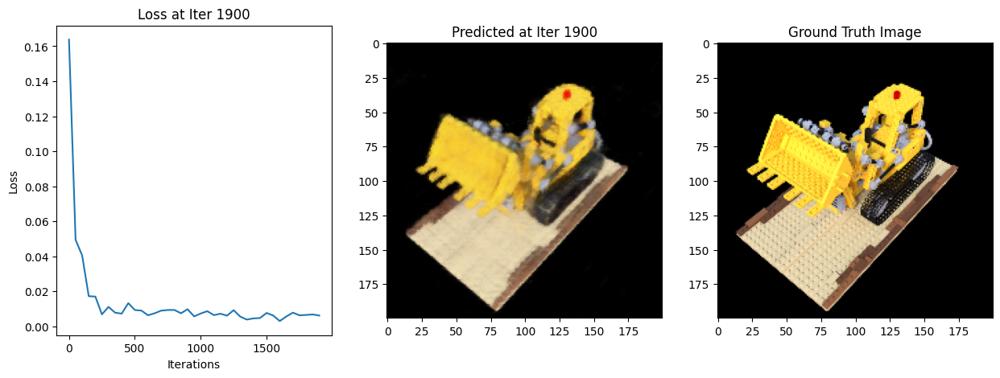

 97%|█████████▋| 1950/2001 [11:08<00:15,  3.26it/s]

Iter: 1950, Loss: 0.002739259507507086


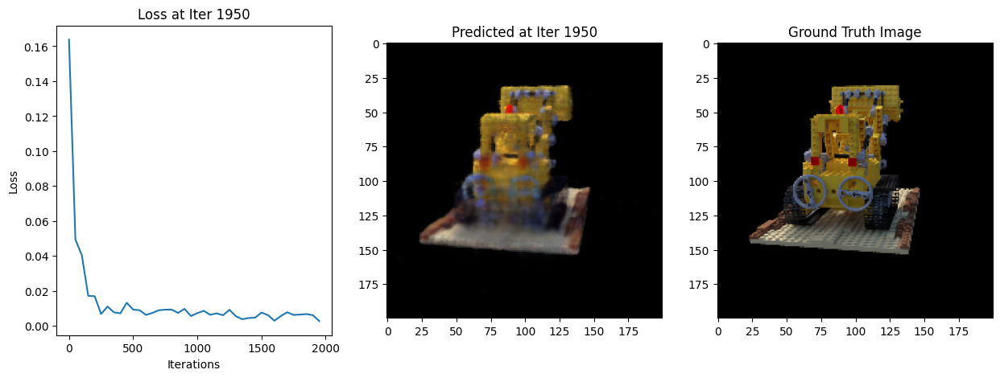

100%|█████████▉| 2000/2001 [11:24<00:00,  3.26it/s]

Iter: 2000, Loss: 0.005737054627388716


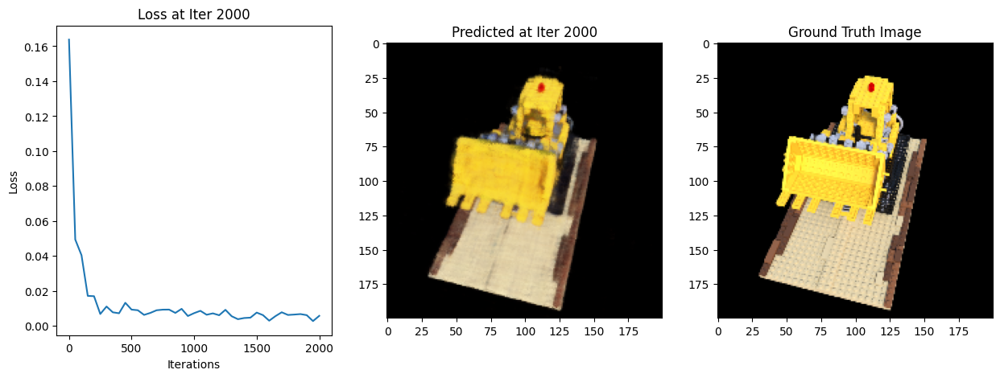

100%|██████████| 2001/2001 [11:26<00:00,  2.91it/s]

Finish training


In [15]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# Load data
# imgs, poses, camera_hwf = load_colmap_data(root_path)

## Test code

# Test if the images are loaded correctly
# plt.imshow(imgs[0])
# plt.show()

# Test get_rays
# ray_origins, ray_directions = get_rays(*camera_hwf, poses[0])

# Test sample_points_from_rays
# sampled_points, depth_values = sample_points_from_rays(ray_origins, ray_directions, 2, 6, 64)

# Test positional_encoding
# pos_enc = positional_encoding(sampled_points, 10)

## Main code continues here

# print the type of img
# print(type(imgs))

# imgs = torch.tensor(imgs)
# poses = torch.tensor(poses)

if isinstance(imgs, np.ndarray):
    imgs = torch.from_numpy(imgs)
elif isinstance(imgs, torch.Tensor):
    pass  # do nothing
else:
    print("T_wc type error")

if isinstance(poses, np.ndarray):
    poses = torch.from_numpy(poses)
elif isinstance(poses, torch.Tensor):
    pass  # do nothing
else:
    print("T_wc type error")

imgs = imgs.to(DEVICE)
poses = poses.to(DEVICE)

# Define the parameters
near_point = 2
far_point = 6
num_depth_samples_per_ray = 96
chunksize = 8192 * 2
max_iters = 2000
# Positional encoding parameters
max_freq_log2 = 10
include_input = True
pos_dim = 3 * (1 + 2 * max_freq_log2) if include_input else 3 * 2 * max_freq_log2

# Initialize the model
model = TinyNeRF(pos_dim).to(DEVICE)

# Train the model
train(imgs, poses, camera_hwf, near_point, far_point, num_depth_samples_per_ray, max_iters, model, chunksize=chunksize, DEVICE=DEVICE)


In [16]:
# Save the model
torch.save(model.state_dict(), root_path + 'model/650tiny_nerf_original_dataset.pth')


tensor([[-9.9990e-01,  4.1922e-03, -1.3346e-02, -5.3798e-02],
        [-1.3989e-02, -2.9966e-01,  9.5394e-01,  3.8455e+00],
        [-4.6566e-10,  9.5404e-01,  2.9969e-01,  1.2081e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e+00]], device='cuda:0')


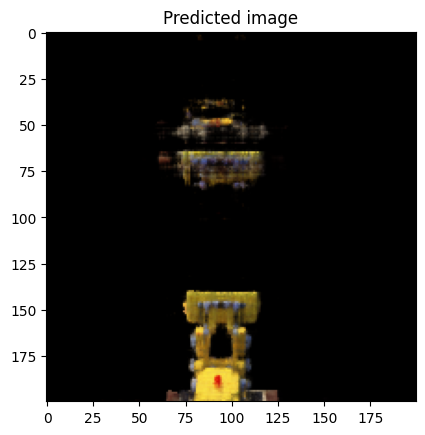

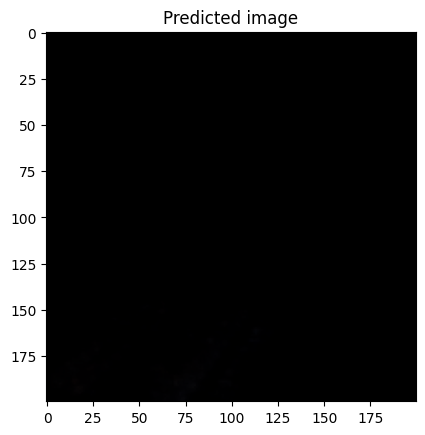

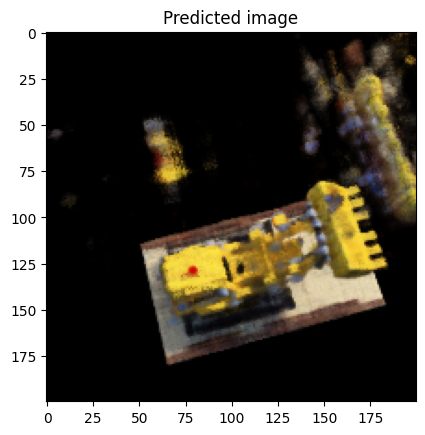

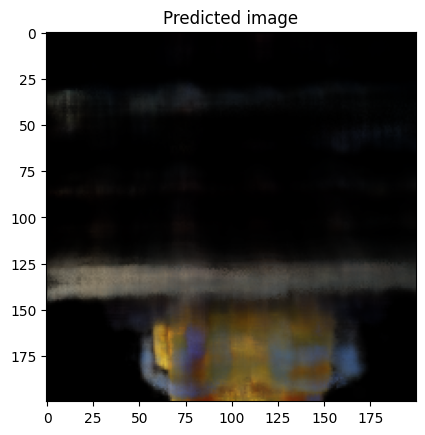

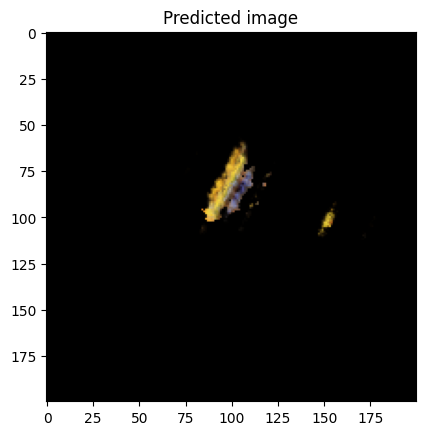

In [17]:
# Load this NeRF model and generates pictures at 5 random directions

test_model = TinyNeRF(pos_dim).to(DEVICE)

test_model_path = root_path + 'model/650tiny_nerf_original_dataset.pth'
test_model.load_state_dict(torch.load(test_model_path))

test_model.eval()

# Randomly generate 5 poses. note that the pose matrces must satisfy SE(3)
torch.manual_seed(45)
np.random.seed(45)

def spherical_to_cartesian(r, theta, phi):
    """
    Convert spherical coordinates to Cartesian coordinates.
    """
    x = r * torch.sin(phi) * torch.cos(theta)
    y = r * torch.sin(phi) * torch.sin(theta)
    z = r * torch.cos(phi)
    return x, y, z

def look_at(camera_position, target_position, up_direction=np.array([0, 1, 0])):
    """
    Generate a look-at matrix for the camera.
    """
    camera_position = camera_position.numpy()
    target_position = target_position.numpy()
    up_direction = up_direction

    z_axis = (camera_position - target_position)
    z_axis /= np.linalg.norm(z_axis)
    x_axis = np.cross(up_direction, z_axis)
    x_axis /= np.linalg.norm(x_axis)
    y_axis = np.cross(z_axis, x_axis)

    rotation_matrix = np.eye(4)
    rotation_matrix[:3, :3] = np.stack([x_axis, y_axis, z_axis], axis=-1)
    translation_matrix = np.eye(4)
    translation_matrix[:3, 3] = -camera_position

    look_at_matrix = rotation_matrix @ translation_matrix
    return torch.tensor(look_at_matrix, dtype=torch.float)

# Generate 5 camera positions focusing on the origin

# Spherical coordinates
r = 4
theta = torch.rand(1) * 2 * np.pi  # Theta angle [0, 2pi]
phi = torch.rand(1) * np.pi / 2 + np.pi / 2   # Phi angle [0, pi]

# Convert to Cartesian coordinates
x, y, z = spherical_to_cartesian(r, theta, phi)

# Camera position
camera_position = torch.tensor([x, y, z])

# Look-at matrix pointing to the origin
pose_matrix = look_at(camera_position, torch.tensor([0.0, 0.0, 0.0]))

# Randomly pick 5 poses from training data
random_indices = np.random.choice(poses.shape[0], 5, replace=False)
test_pose = poses[random_indices]


# poses now contains 5 random camera poses focusing on the origin
# test_poses = torch.stack(test_poses)
# print(test_poses)
print(test_pose[0])
test_pose[0][0, 3] *= 3.4
test_pose[0][1, 3] *= 1.2
test_pose[0][2, 3] *= 2.9

test_pose[1][0, 3] *= 3.1
test_pose[1][1, 3] *= 0.4
test_pose[1][2, 3] *= 0.9

test_pose[2][0, 3] *= 0.8
test_pose[2][1, 3] *= 1.8
test_pose[2][2, 3] *= 1.3

test_pose[3] *= -0.6

test_pose[4][0, 3] *= 1.8
test_pose[4][1, 3] *= 0.7
test_pose[4][2, 3] *= 2.9

H, W, focal_length = camera_hwf
H = int(H)
W = int(W)

# Generate 5 images
for i in range(5):
    predicted_img = nerf_step_forward(H, W, focal_length, test_pose[i], near_point, far_point, num_depth_samples_per_ray, chunksize, test_model)

    plt.figure()
    predicted_img = predicted_img.cpu().detach().numpy()
    predicted_img = np.clip(predicted_img, 0, 1)
    plt.imshow(predicted_img)
    plt.title("Predicted image")


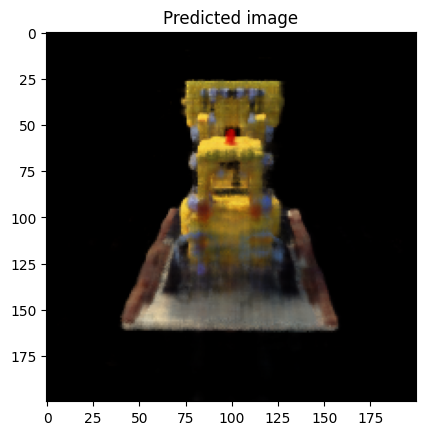

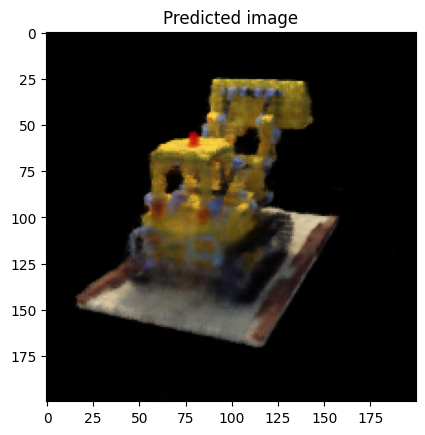

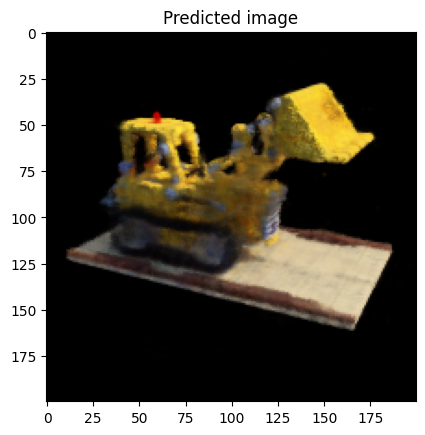

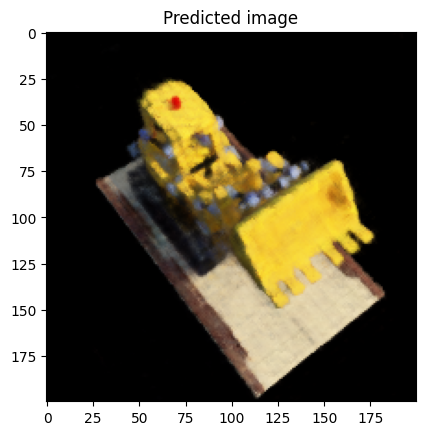

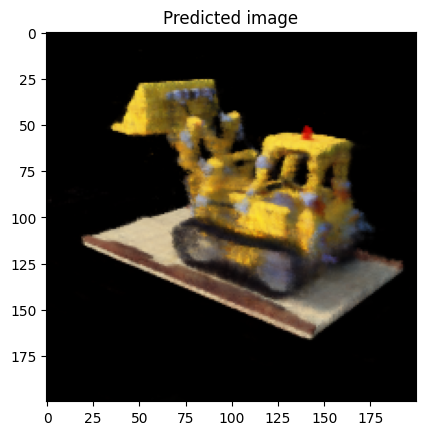

In [18]:
# Use randomly generated poses
test_poses = []
for _ in range(5):
    # Spherical coordinates
    r = 4
    theta = torch.rand(1) * 2 * np.pi  # Theta angle [0, 2pi]
    phi = torch.rand(1) * np.pi / 2 + np.pi / 2   # Phi angle [0, pi]

    # Convert to Cartesian coordinates
    x, y, z = spherical_to_cartesian(r, theta, phi)

    # Camera position
    camera_position = torch.tensor([x, y, z])

    # Look-at matrix pointing to the origin
    test_pose = look_at(camera_position, torch.tensor([0.0, 0.0, 0.0]))

    test_poses.append(test_pose)

for i in range(5):
    predicted_img = nerf_step_forward(H, W, focal_length, poses[i], near_point, far_point, num_depth_samples_per_ray, chunksize, test_model)

    plt.figure()
    predicted_img = predicted_img.cpu().detach().numpy()
    predicted_img = np.clip(predicted_img, 0, 1)
    plt.imshow(predicted_img)
    plt.title("Predicted image")